In [1]:
TRAIN = '/kaggle/input/rare-us-coin-image-dataset/base_data_RUSCoinNet/training'
TEST = '/kaggle/input/rare-us-coin-image-dataset/base_data_RUSCoinNet/testing'

We want to use image embeddings for both EDA and classification, so let's add some code to get image embeddings from ResNeXt50 with no fine tuning.

In [2]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np


DEVICE = torch.device('cpu')
OUTPUT_SIZE = 2048

model = models.resnext50_32x4d(weights=models.ResNeXt50_32X4D_Weights.IMAGENET1K_V2)

extraction_layer = model._modules.get('avgpool')
model.to(DEVICE)
model.eval()

scaler = transforms.Resize((224, 224))
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
to_tensor = transforms.ToTensor()

def get_vec(arg, model, extraction_layer):
    image = normalize(to_tensor(scaler(arg))).unsqueeze(0).to(DEVICE)
    result = torch.zeros(1, OUTPUT_SIZE, 1, 1)
    def copy_data(m, i, o):
        result.copy_(o.data)
    hooked = extraction_layer.register_forward_hook(copy_data)
    with torch.no_grad():
        model(image)
    hooked.remove()
    return result

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-1a0047aa.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-1a0047aa.pth
100%|██████████| 95.8M/95.8M [00:00<00:00, 171MB/s]


Next let's load up our training data and our test data. We don't have a lot of data, so we can load it all: image embeddings and thumbnails.

In [3]:
import arrow
import base64
import pandas as pd
from glob import iglob
from io import BytesIO
from os.path import basename
from PIL import Image

THUMBNAIL_SIZE = (64, 64)

def embed(model, filename: str):
    with Image.open(fp=filename, mode='r') as image:
        return get_vec(arg=image.convert('RGB'), model=model, extraction_layer=extraction_layer).numpy().reshape(OUTPUT_SIZE,)


# https://stackoverflow.com/a/952952
def flatten(arg):
    return [x for xs in arg for x in xs]

def png(filename: str) -> str:
    with Image.open(fp=filename, mode='r') as image:
        buffer = BytesIO()
        # our images are pretty big; let's shrink the hover images to thumbnail size
        image.resize(size=THUMBNAIL_SIZE).convert('RGB').save(buffer, format='png')
        return 'data:image/png;base64,' + base64.b64encode(buffer.getvalue()).decode()

def get_picture_from_glob(arg: str, tag: str,) -> list:
    time_get = arrow.now()
    result = [pd.Series(data=[tag, basename(input_file), embed(model=model, filename=input_file), png(filename=input_file)],
                        index=['tag', 'name', 'value', 'png'] )
        for index, input_file in enumerate(list(iglob(pathname=arg))) ]
    print('encoded {} rows of {}  in {}'.format(len(result), tag, arrow.now() - time_get))
    return result

time_start = arrow.now()
train_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TRAIN + '/*') }
train_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key) for key, value in train_dict.items()]))
test_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TEST + '/*') }
test_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key) for key, value in test_dict.items()]))

print('done in {}'.format(arrow.now() - time_start))

encoded 168 rows of kennedy  in 0:00:28.244947
encoded 222 rows of eisenhower  in 0:00:37.216543
encoded 191 rows of morgan  in 0:00:32.273371
encoded 105 rows of susan  in 0:00:17.593490
encoded 188 rows of franklin  in 0:00:32.674926
encoded 43 rows of kennedy  in 0:00:06.931412
encoded 56 rows of eisenhower  in 0:00:08.522690
encoded 48 rows of morgan  in 0:00:09.114181
encoded 27 rows of susan  in 0:00:04.462117
encoded 46 rows of franklin  in 0:00:07.240861
done in 0:03:04.411917


In [4]:
test_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TEST + '/*') }
test_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key) for key, value in test_dict.items()]))

encoded 43 rows of kennedy  in 0:00:06.893860
encoded 56 rows of eisenhower  in 0:00:08.264105
encoded 48 rows of morgan  in 0:00:08.324662
encoded 27 rows of susan  in 0:00:04.294218
encoded 46 rows of franklin  in 0:00:06.858270


Are our classes balanced in our training data?

In [5]:
train_df['tag'].value_counts(normalize=True).to_frame().T

tag,eisenhower,morgan,franklin,kennedy,susan
proportion,0.254005,0.218535,0.215103,0.19222,0.120137


Are our classes balanced in our test data?

In [6]:
test_df['tag'].value_counts(normalize=True).to_frame().T

tag,eisenhower,morgan,franklin,kennedy,susan
proportion,0.254545,0.218182,0.209091,0.195455,0.122727


Let's add x/y coordinates, based on our image embeddings, for both training data and test data. We'll use TSNE because it's good enough and it doesn't require us to install an additional packages.

In [7]:
from sklearn.manifold import TSNE

train_reducer = TSNE(random_state=2025, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
train_df[['x', 'y']] = train_reducer.fit_transform(X=train_df['value'].apply(func=pd.Series))
test_reducer = TSNE(random_state=2025, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
test_df[['x', 'y']] = test_reducer.fit_transform(X=test_df['value'].apply(func=pd.Series))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 874 samples in 0.017s...
[t-SNE] Computed neighbors for 874 samples in 0.156s...
[t-SNE] Computed conditional probabilities for sample 874 / 874
[t-SNE] Mean sigma: 2.892192
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.879105
[t-SNE] KL divergence after 1000 iterations: 1.045114
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 220 samples in 0.001s...
[t-SNE] Computed neighbors for 220 samples in 0.015s...
[t-SNE] Computed conditional probabilities for sample 220 / 220
[t-SNE] Mean sigma: 3.455226
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.217133
[t-SNE] KL divergence after 1000 iterations: 0.660217


Now we're ready to plot. Let's just plot our training data; we're looking to see if TSNE can cluster our image embeddings into clusters that are tight within classes and separated between classes. If so then almost any model will do a good job of classifying our data. It may also show us if we have hard cases, that lie on class/cluster boundaries, and if so how many and where.

In [8]:
from bokeh.models import ColumnDataSource
from bokeh.models import HoverTool

from bokeh.plotting import figure
from bokeh.plotting import output_notebook
from bokeh.plotting import show
from bokeh.palettes import Turbo256
from bokeh.transform import factor_cmap

output_notebook()

datasource = ColumnDataSource(train_df[['png', 'tag', 'x', 'y']])
factor_count = max(train_df['tag'].nunique(), 3)
indices = np.linspace(0, len(Turbo256)-1, factor_count, dtype=int)
palette = [Turbo256[index] for index in indices]
mapper = factor_cmap(field_name = 'tag', palette=palette, factors=train_df['tag'].unique().tolist(), start=0, end=factor_count-1, )

plot_figure = figure(title='TSNE projection: rare US coins', width=1000, height=800, tools=('pan, wheel_zoom, reset'))

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@png' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 18px'>@tag</span>
    </div>
</div>
"""))

plot_figure.scatter(x='x', y='y', source=datasource, line_alpha=0.6, fill_alpha=0.6, size=8, color=mapper)
show(plot_figure)

Loading BokehJS ...

What do we see? By and large TSNE clusters our data in a manner that is aligned with our classes, but they are neither tight nor separated, and we have some hard cases. Let's build a model and see how we do.

In [9]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

logreg = LogisticRegression(max_iter=1000, tol=1e-12).fit(train_df['value'].apply(func=pd.Series), train_df['tag'])
print('model fit in {} iterations'.format(logreg.n_iter_[0]))
print('accuracy: {:5.4f}'.format(accuracy_score(y_true=test_df['tag'], y_pred=logreg.predict(X=test_df['value'].apply(func=pd.Series)))))
print('f1: {:5.4f}'.format(f1_score(average='weighted', y_true=test_df['tag'], y_pred=logreg.predict(X=test_df['value'].apply(func=pd.Series)))))
print(classification_report(y_true=test_df['tag'], y_pred=logreg.predict(X=test_df['value'].apply(func=pd.Series))))

model fit in 403 iterations
accuracy: 0.9636
f1: 0.9639
              precision    recall  f1-score   support

  eisenhower       0.90      0.98      0.94        56
    franklin       0.98      0.93      0.96        46
     kennedy       0.98      0.93      0.95        43
      morgan       1.00      1.00      1.00        48
       susan       1.00      0.96      0.98        27

    accuracy                           0.96       220
   macro avg       0.97      0.96      0.97       220
weighted avg       0.97      0.96      0.96       220



Wow. This is much better than we might have expected based on our scatter plot above. Let's take a look at our model probabilities.

<Axes: xlabel='probability', ylabel='Count'>

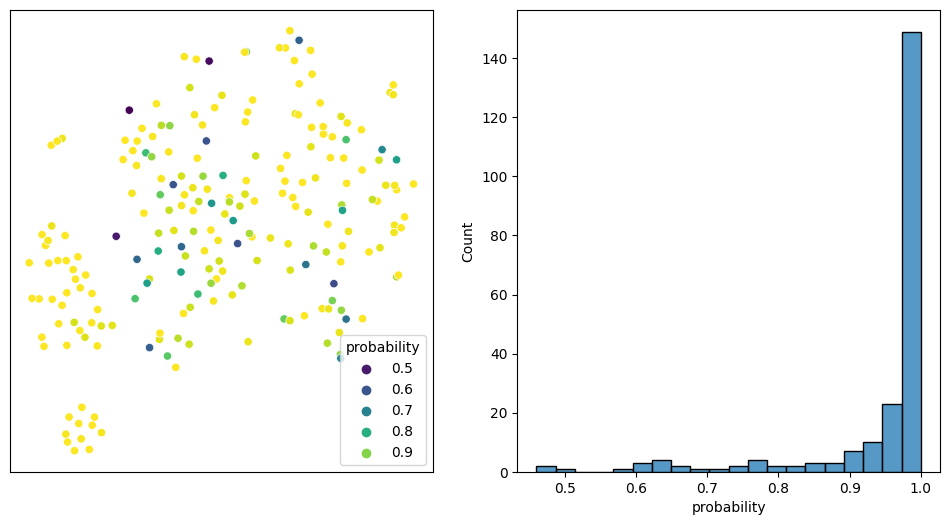

In [10]:
import matplotlib.pyplot as plt
import warnings
from seaborn import histplot
from seaborn import scatterplot

warnings.filterwarnings('ignore', category=FutureWarning, module='seaborn')

plot_df = test_df[['x', 'y']].copy()
plot_df['probability'] = np.max(logreg.predict_proba(X=test_df['value'].apply(func=pd.Series)), axis=1)

plt, ax = plt.subplots(ncols=2, figsize=(12, 6))
scatterplot(ax=ax[0], data=plot_df, x='x', y='y', hue='probability', palette='viridis')
ax[0].set(xlabel=None) 
ax[0].set(ylabel=None)
ax[0].set(xticklabels=[])
ax[0].set(yticklabels=[])
ax[0].tick_params(axis='both', which='both', length=0)
histplot(ax=ax[1], data=plot_df, x='probability', bins=20)

Our test data clusters look different because we build a different reducer for our test data, but we see it has a lot of high model probabilities, and the lower model probabilities are scattered in places where TSNE doesn't cluster data tightly.